<a href="https://colab.research.google.com/github/datneuro/Immunoproteasome_PD/blob/main/Fig_3___sc_RNAseq_Github.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preprocessing

*This part is used for processing 1 seprated file/sample (checking*)

In [ ]:
import scanpy as sc
import pandas as pd
import os
import numpy as np

In [ ]:
data = pd.read_csv("data/tsv_files/WT_ROT.tsv", sep="\t", index_col=0)
adata = sc.AnnData(X=data.T)
adata.obs['Cell_line'] = 'WT'
adata.obs['Treatment'] = 'ROT'
print(adata)

AnnData object with n_obs × n_vars = 1556 × 33694
    obs: 'Cell_line', 'Treatment'


In [ ]:
adata.X.max()

8608.0

In [ ]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')

In [ ]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

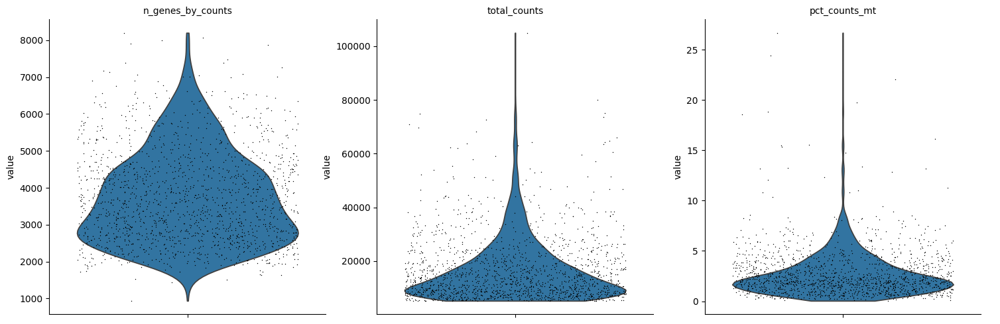

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

In [ ]:
adata

AnnData object with n_obs × n_vars = 1556 × 33694
    obs: 'Cell_line', 'Treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

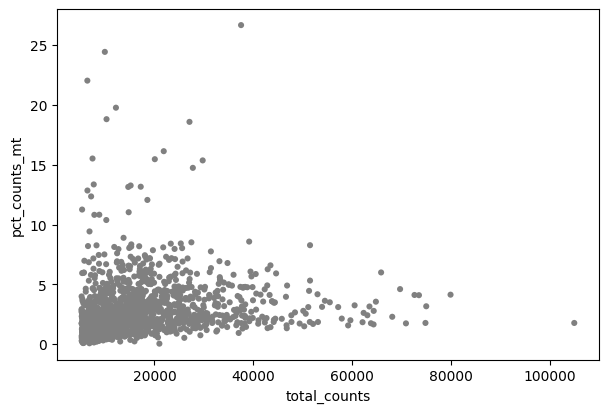

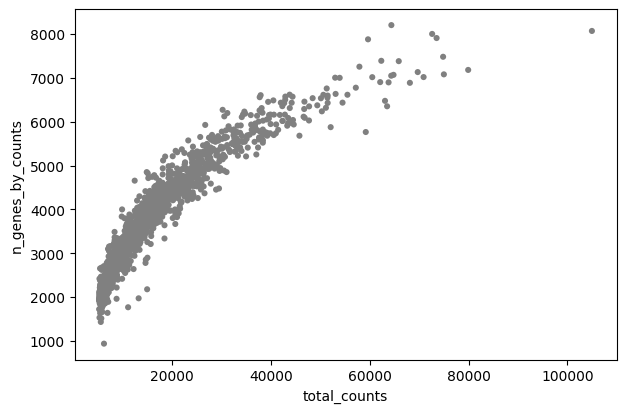

In [ ]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [ ]:
adata

AnnData object with n_obs × n_vars = 1556 × 33694
    obs: 'Cell_line', 'Treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [ ]:
!pip install scvi-tools

In [ ]:
import scvi
scvi.settings.seed= 0

INFO: Seed set to 0
INFO:lightning.fabric.utilities.seed:Seed set to 0


In [ ]:
!pip install scikit-misc

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.0/189.0 kB 5.1 MB/s eta 0:00:00


In [ ]:
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True, flavor='seurat_v3')
scvi.model.SCVI.setup_anndata(adata)
vae = scvi.model.SCVI(adata)
vae.train()
solo = scvi.external.SOLO.from_scvi_model(vae)
solo.train()
df = solo.predict()
df['prediction'] = solo.predict(soft=False)
df.index = df.index.map(lambda x: x[:-2])
df['dif'] = df.doublet - df.singlet
doublets = df[(df.prediction == 'doublet') & (df.dif > 1)]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


In [ ]:
doublets = df[(df.prediction == 'doublet') & (df.dif > 0.5)]
doublets

,doublet,singlet,prediction,dif
AAAGCAACAATCCAAC,0.916001,0.083999,doublet,0.832002
AACCGCGGTTTACTCT,0.954829,0.045171,doublet,0.909657
AACGTTGTCGTCACGG,0.790478,0.209522,doublet,0.580956
AAGCCGCAGCGAGAAA,0.758971,0.241029,doublet,0.517941
ACACCAAAGCTATGCT,0.827363,0.172636,doublet,0.654727
ACACTGATCCGCGGTA,0.764858,0.235142,doublet,0.529715
ACGCCGACATACTCTT,0.852755,0.147245,doublet,0.705511
ACGGCCATCTGCCAGG,0.893459,0.106541,doublet,0.786917
AGACGTTTCCTTCAAT,0.899384,0.100616,doublet,0.798767
AGCATACTCCAGTAGT,0.864657,0.135343,doublet,0.729315


In [ ]:
len(doublets)

58

# scVI SOLO

*This part is used for doublet detection and removal*

In [ ]:
def pp(file_path):
    file_name = os.path.basename(file_path)
    print(f"Processing file: {file_name}")

    data = pd.read_csv(file_path, sep="\t", index_col=0)
    adata = sc.AnnData(X=data.T)

    print(f"Running scVI and SOLO pipeline for: {file_name}")
    sc.pp.filter_genes(adata, min_cells=10)
    sc.pp.highly_variable_genes(adata, n_top_genes=2000, subset=True, flavor='seurat_v3')
    scvi.model.SCVI.setup_anndata(adata)
    vae = scvi.model.SCVI(adata)
    vae.train()
    solo = scvi.external.SOLO.from_scvi_model(vae)
    solo.train()
    df = solo.predict()
    df['prediction'] = solo.predict(soft=False)
    df.index = df.index.map(lambda x: x[:-2])
    df['dif'] = df.doublet - df.singlet
    doublets = df[(df.prediction == 'doublet') & (df.dif > 1)]

    if doublets.empty:
        print(f"No doublets detected in: {file_name}")
    else:
        print(f"Doublets detected in: {file_name}, count: {len(doublets)}")

    print(f"Removing doublets for: {file_name}")
    data = pd.read_csv(file_path, sep="\t", index_col=0)
    adata = sc.AnnData(X=data.T)
    parts = file_name.replace('.tsv', '').split('_')
    adata.obs['Cell_line'] = parts[0]
    adata.obs['Treatment'] = parts[1] if len(parts) > 1 else 'Unknown'
    adata.obs['ID'] = file_name.replace('.tsv', '')
    adata.obs['doublet'] = adata.obs.index.isin(doublets.index)
    adata = adata[~adata.obs.doublet]

    print(f"Running QC steps for: {file_name}")
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    adata.var['mt'] = adata.var_names.str.startswith('mt-')
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

    upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, 0.98)
    adata = adata[adata.obs.n_genes_by_counts < upper_lim]
    adata = adata[adata.obs.pct_counts_mt < 10]

    print(f"Finished processing: {file_name}")
    return adata

In [ ]:
adata_list = []
for file in os.listdir('data/tsv_files/'):
    adata_list.append(pp(os.path.join('data/tsv_files/', file)))

Processing file: WT_ROT.tsv
Running scVI and SOLO pipeline for: WT_ROT.tsv


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


No doublets detected in: WT_ROT.tsv
Removing doublets for: WT_ROT.tsv
Running QC steps for: WT_ROT.tsv


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_simple.py:168: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: WT_ROT.tsv
Processing file: WT_TUN.tsv
Running scVI and SOLO pipeline for: WT_TUN.tsv


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.239. Signaling Trainer to stop.
No doublets detected in: WT_TUN.tsv
Removing doublets for: WT_TUN.tsv


/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: WT_TUN.tsv


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_simple.py:168: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: WT_TUN.tsv
Processing file: WT_UNT.tsv
Running scVI and SOLO pipeline for: WT_UNT.tsv


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.203. Signaling Trainer to stop.
No doublets detected in: WT_UNT.tsv
Removing doublets for: WT_UNT.tsv


/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: WT_UNT.tsv


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_simple.py:168: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: WT_UNT.tsv
Processing file: HE_UNT.tsv
Running scVI and SOLO pipeline for: HE_UNT.tsv


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.177. Signaling Trainer to stop.
No doublets detected in: HE_UNT.tsv
Removing doublets for: HE_UNT.tsv


/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: HE_UNT.tsv


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_simple.py:168: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: HE_UNT.tsv
Processing file: HE_TUN.tsv
Running scVI and SOLO pipeline for: HE_TUN.tsv


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.182. Signaling Trainer to stop.
No doublets detected in: HE_TUN.tsv
Removing doublets for: HE_TUN.tsv


/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: HE_TUN.tsv


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_simple.py:168: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: HE_TUN.tsv
Processing file: HE_ROT.tsv
Running scVI and SOLO pipeline for: HE_ROT.tsv


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Creating doublets, preparing SOLO model.                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.162. Signaling Trainer to stop.
No doublets detected in: HE_ROT.tsv
Removing doublets for: HE_ROT.tsv


/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/_contextlib.py:116: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


Running QC steps for: HE_ROT.tsv


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_simple.py:168: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Finished processing: HE_ROT.tsv


In [ ]:
for adata in adata_list:
    print(adata)

View of AnnData object with n_obs × n_vars = 1524 × 19163
    obs: 'Cell_line', 'Treatment', 'ID', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
View of AnnData object with n_obs × n_vars = 2673 × 19148
    obs: 'Cell_line', 'Treatment', 'ID', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
View of AnnData object with n_obs × n_vars = 2971 × 19806
    obs: 'Cell_line', 'Treatment', 'ID', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
View of AnnData object with n_obs × n_vars = 3080 × 20186
    obs: 'Cell_line', 'Treatment', 'ID', 'doublet', 'n_ge

In [ ]:
len(adata_list)

6

In [ ]:
adata_list[0].obs

,Cell_line,Treatment,ID,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
AAACCTGAGCTAGTCT-1,WT,ROT,WT_ROT,False,2119,2119,5384.0,0.0,0.0
AAACCTGAGTCGTACT-1,WT,ROT,WT_ROT,False,3631,3628,15615.0,0.0,0.0
AAACCTGAGTGAAGAG-1,WT,ROT,WT_ROT,False,3308,3307,12411.0,0.0,0.0
AAACCTGAGTTTGCGT-1,WT,ROT,WT_ROT,False,3435,3433,10845.0,0.0,0.0
AAACCTGCATTACCTT-1,WT,ROT,WT_ROT,False,3798,3795,13843.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
TTTGCGCTCGCGTAGC-1,WT,ROT,WT_ROT,False,2480,2480,8492.0,0.0,0.0
TTTGGTTAGAGCTTCT-1,WT,ROT,WT_ROT,False,6134,6132,37204.0,0.0,0.0
TTTGGTTAGGCAGTCA-1,WT,ROT,WT_ROT,False,2577,2575,8220.0,0.0,0.0
TTTGTCACAGGTGGAT-1,WT,ROT,WT_ROT,False,3328,3328,9574.0,0.0,0.0


In [ ]:
adata = sc.concat(adata_list)

In [ ]:
adata

AnnData object with n_obs × n_vars = 17803 × 17480
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'

In [ ]:
adata.write_h5ad('data/concat_data.h5ad')

# scVI INTEGRATION

In [ ]:
adata = sc.read_h5ad('data/concat_data.h5ad')

/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

In [ ]:
adata

AnnData object with n_obs × n_vars = 17803 × 17480
    obs: 'Cell_line', 'Treatment', 'ID', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    uns: 'log1p'
    layers: 'counts'

In [ ]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=10000,
    subset=True,
    layer="counts",
    flavor="seurat_v3",
    batch_key="ID",
)

/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    categorical_covariate_keys=["ID"],
    continuous_covariate_keys=["pct_counts_mt","total_counts"],
)

In [ ]:
model = scvi.model.SCVI(adata)

In [ ]:
import warnings
warnings.filterwarnings("ignore", ".*does not have many workers.*")

In [ ]:
model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|█| 400/400 [59:53<00:00, 10.99s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [59:53<00:00,  8.98s/it, v_num=1, train_loss_step


In [ ]:
model.save('model.modelscVI')

In [ ]:
adata.obsm['X_scVI'] = model.get_latent_representation()
adata.layers['scvi_normalized'] = model.get_normalized_expression(library_size = 1e4)

In [ ]:
sc.pp.neighbors(adata,use_rep = 'X_scVI'
                )

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [ ]:
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution = 0.5)

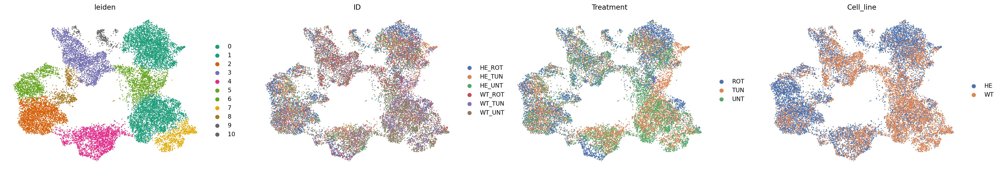

In [ ]:
sc.pl.umap(adata, color = ['leiden', 'ID','Treatment','Cell_line'], frameon = False,size = 10,show = False)
plt.savefig(
    'results/Integrated_Data.png',
    dpi=2000,
    format='png')

plt.show()

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden')

In [ ]:
markers = sc.get.rank_genes_groups_df(adata, None)
markers = markers[(markers.pvals_adj < 0.05) & (markers.logfoldchanges > .5)]
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,SPINT2,135.988251,2.897212,0.000000,0.000000
1,0,CHGA,128.571915,4.550056,0.000000,0.000000
2,0,NENF,127.253914,2.967783,0.000000,0.000000
3,0,CGA,120.035286,6.656636,0.000000,0.000000
4,0,WFDC2,115.577103,5.396098,0.000000,0.000000
...,...,...,...,...,...,...
175347,10,PPP1R7,2.184156,0.828682,0.032996,0.046972
175348,10,SCGB2A1,2.177918,5.124706,0.033491,0.047650
175349,10,SMIM1,2.176509,1.426394,0.033594,0.047785
175350,10,COX14,2.168590,0.537753,0.034209,0.048608


In [ ]:
markers_scvi = model.differential_expression(groupby = 'leiden')
markers_scvi = markers_scvi[(markers_scvi['is_de_fdr_0.05']) & (markers_scvi.lfc_mean > .5)]
markers_scvi

DE...: 100%|████████████████████████████████████| 11/11 [00:45<00:00,  4.13s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
CALCA,0.9980,0.0020,6.212601,0.005478,0.000102,0.0,0.25,5.680545,5.756633,2.044988,...,57.891265,0.439535,0.792303,0.172070,66.838264,0.758115,True,0 vs Rest,0,Rest
CGA,0.9968,0.0032,5.741396,0.023172,0.000371,0.0,0.25,5.896713,5.987148,2.067075,...,334.021991,2.354601,0.963348,0.525570,342.921521,3.366811,True,0 vs Rest,0,Rest
NENF,0.9968,0.0032,5.741396,0.001894,0.000323,0.0,0.25,2.724874,2.596880,1.012522,...,16.924863,2.376488,0.990226,0.693097,21.158949,3.427666,True,0 vs Rest,0,Rest
RGL3,0.9962,0.0038,5.568944,0.000103,0.000007,0.0,0.25,4.553271,4.542538,1.696591,...,0.740073,0.011494,0.445632,0.009154,0.918511,0.015039,True,0 vs Rest,0,Rest
SMIM22,0.9960,0.0040,5.517450,0.000082,0.000005,0.0,0.25,4.578762,4.586317,1.827318,...,0.661576,0.011425,0.346671,0.007227,0.728647,0.015102,True,0 vs Rest,0,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TIMP4,0.9020,0.0980,2.219647,0.000009,0.000007,0.0,0.25,0.578721,0.635664,1.969074,...,0.000000,0.016682,0.000000,0.014315,0.000000,0.024434,True,10 vs Rest,10,Rest
PSENEN,0.9016,0.0984,2.215130,0.000670,0.000249,0.0,0.25,1.173570,1.266144,1.217655,...,3.288136,1.974639,0.796610,0.716806,8.393157,2.916745,True,10 vs Rest,10,Rest
NFATC1,0.9016,0.0984,2.215130,0.000025,0.000013,0.0,0.25,1.691771,1.437379,1.821397,...,0.084746,0.059513,0.084746,0.048693,0.248656,0.073669,True,10 vs Rest,10,Rest
RASGRF2-AS1,0.9016,0.0984,2.215130,0.000005,0.000003,0.0,0.25,0.856242,0.830671,1.798235,...,0.033898,0.012624,0.033898,0.011666,0.037292,0.016344,True,10 vs Rest,10,Rest


In [ ]:
markers.to_csv("results/markers.csv", index=False)
markers_scvi.to_csv("results/markers_scvi.csv", index=False)

In [ ]:
markers = pd.read_csv("markers.csv")
markers_scvi = pd.read_csv("markers_scvi.csv")

In [ ]:
markers[(markers.group == "1") & (markers.logfoldchanges > 4)].sort_values(by="logfoldchanges", ascending=False)

,group,names,scores,logfoldchanges,pvals,pvals_adj
20875,1,ARHGAP36,8.728461,5.303221,4.122687e-18,1.130247e-17
21916,1,RP11-714L20.1,6.533327,4.958044,7.478122e-11,1.606854e-10
17955,1,CRHBP,27.225479,4.883450,9.095918e-147,1.284303e-145
18434,1,ADCY8,19.542620,4.717752,2.218211e-80,1.740320e-79
21335,1,RP11-573J24.1,7.670379,4.492458,2.266589e-14,5.534289e-14
18771,1,PTGFR,16.768126,4.468928,1.592223e-60,9.929381e-60
18905,1,GPR83,15.841674,4.419766,1.886808e-54,1.081003e-53
18055,1,UTS2,25.051407,4.338565,1.376843e-126,1.655242e-125
19346,1,SYTL5,13.565126,4.328973,8.737345e-41,3.997090e-40
19335,1,CHRNA6,13.616751,4.303352,4.434853e-41,2.042720e-40


In [ ]:
markers_scvi[(markers_scvi.group1 =="1") & (markers_scvi.lfc_mean >4)].sort_values(by="lfc_mean", ascending=False)

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
PLPPR4,0.9850,0.0150,4.184591,0.000085,0.000006,0.0,0.25,6.319741,6.581001,3.114822,...,0.325394,0.026130,0.255230,0.022523,0.775613,0.054614,True,1 vs Rest,1,Rest
ONECUT1,0.9836,0.0164,4.093937,0.000054,0.000007,0.0,0.25,5.434517,5.492558,3.205822,...,0.160283,0.021366,0.134857,0.017079,0.379575,0.041399,True,1 vs Rest,1,Rest
RP11-714L20.1,0.9878,0.0122,4.394043,0.000017,0.000001,0.0,0.25,5.078855,5.045570,3.046471,...,0.028001,0.001021,0.016736,0.000817,0.050422,0.001291,True,1 vs Rest,1,Rest
HTR5A,0.9736,0.0264,3.607636,0.000016,0.000002,0.0,0.25,4.784904,4.962733,2.847705,...,0.057934,0.005444,0.056003,0.005444,0.138483,0.012244,True,1 vs Rest,1,Rest
CHRNA6,0.9854,0.0146,4.212025,0.000022,0.000002,0.0,0.25,4.781545,4.810172,2.538612,...,0.075636,0.003947,0.070486,0.003811,0.186312,0.009440,True,1 vs Rest,1,Rest
VSTM2B,0.9668,0.0332,3.371441,0.000033,0.000009,0.0,0.25,4.766484,4.903810,3.543287,...,0.091728,0.018440,0.076279,0.015038,0.193072,0.048441,True,1 vs Rest,1,Rest
GPR83,0.9822,0.0178,4.010596,0.000039,0.000004,0.0,0.25,4.713242,4.873092,2.562490,...,0.113936,0.006805,0.094303,0.005852,0.263753,0.011379,True,1 vs Rest,1,Rest
ZPLD1,0.9784,0.0216,3.813225,0.000038,0.000005,0.0,0.25,4.570686,4.509336,3.132779,...,0.018024,0.002926,0.011587,0.002518,0.035262,0.006401,True,1 vs Rest,1,Rest
POU4F1,0.9668,0.0332,3.371441,0.000028,0.000009,0.0,0.25,4.540207,4.261266,3.569893,...,0.012230,0.031165,0.008046,0.022659,0.031179,0.064988,True,1 vs Rest,1,Rest
PNMA5,0.9858,0.0142,4.240211,0.000078,0.000009,0.0,0.25,4.516194,4.546553,2.438889,...,0.231413,0.015174,0.195687,0.013881,0.561890,0.036391,True,1 vs Rest,1,Rest


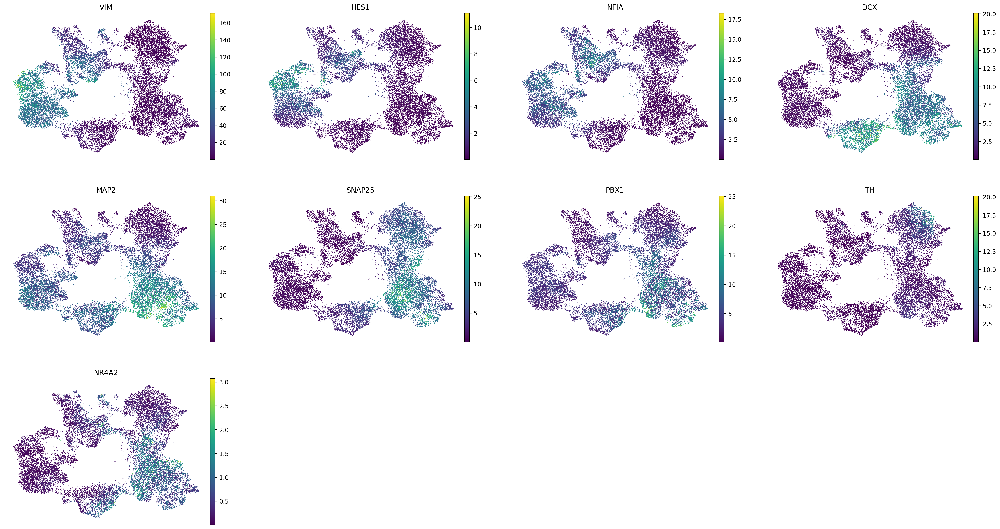

In [ ]:
sc.pl.umap(adata, color = ['VIM','HES1','NFIA',
                             'DCX','MAP2', 'SNAP25',
                              'PBX1','TH','NR4A2'], frameon = False,layer = 'scvi_normalized',show= False)
plt.savefig(
    'results/Markers.png',
    dpi=2000,
    bbox_inches='tight',
    format='png'  )
plt.show()

In [ ]:
cell_type = {"0":"DA1",
"1":"DA2",
"2":"Prog2",
"3":"Prog1",
"4":"DA4",
"5":"DA1",
"6":"Prog2",
"7":"DA3",
"8":"Prog2",
"9":"Prog1",
"10":"Prog1"
}

In [ ]:
adata.write_h5ad('results/Annotated_data.h5ad')

# LOAD AND SETTINGS

In [ ]:
import scanpy as sc
import scvi
import seaborn as sns
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from scipy import stats
import plotnine as p9
from plotnine import ggplot, aes, geom_point, geom_label, labs, scale_color_manual, theme
from plotnine.themes.elements import element_text
import matplotlib.pyplot as plt
from matplotlib import rcParams

In [ ]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.1.6.post2


In [ ]:
torch.set_float32_matmul_precision("high")
%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

In [ ]:
adata = sc.read_h5ad('data/Annotated_data.h5ad')

In [ ]:
model = scvi.model.SCVI.load('data/model.modelscVI',adata)

INFO     File data/model.modelscVI/model.pt already downloaded                                                     


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


# ANALYSIS

## UMAP plots

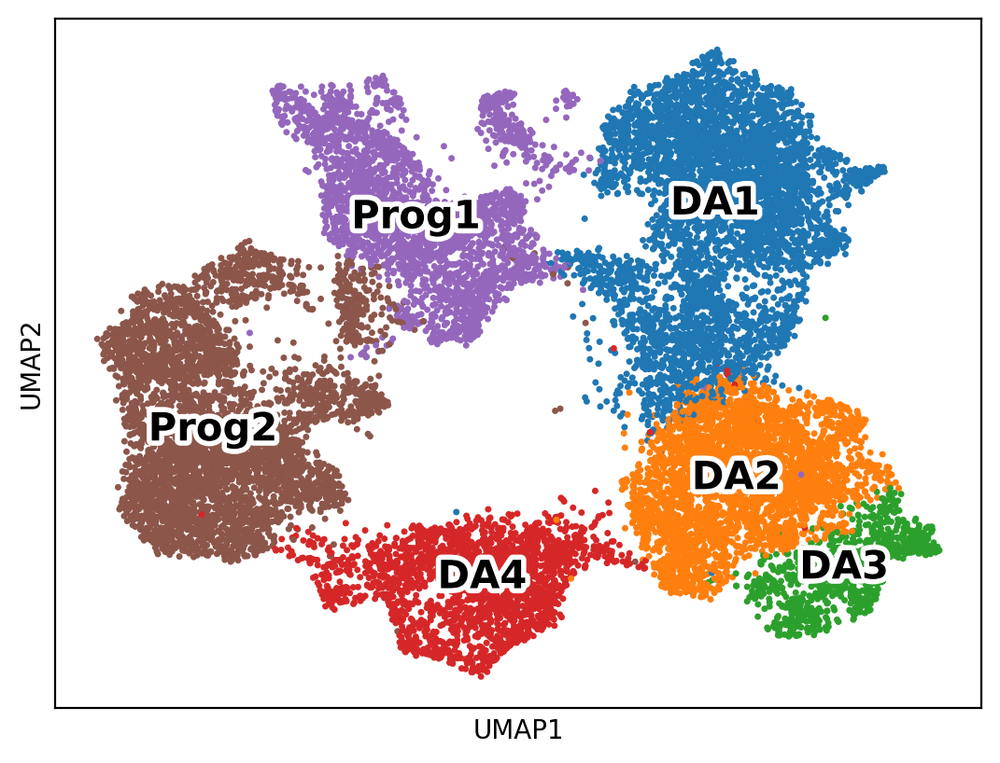

In [ ]:
sc.pl.umap(
    adata,
    color='cell_type',
    legend_loc='on data',
    size=25,
    legend_fontsize=15,
    legend_fontweight='bold',
    legend_fontoutline=4,
    title='',
    show= False
)
plt.savefig(
    'results/UMAP_Celltype.png',
    dpi=2000,
    bbox_inches='tight',
    format='png'
)
plt.show()

## Mannwhitneyu

In [ ]:
adata.X = adata.layers['scvi_normalized']

In [ ]:
temp = adata[(adata.obs.cell_type.isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line.isin(['WT'])) & (adata.obs.Treatment.isin(['UNT','ROT']))]
i = np.where(temp.var_names == 'PSMB8')[0][0]

In [ ]:
a = temp[temp.obs.Treatment == 'ROT'].X[:,i]
b = temp[temp.obs.Treatment == 'UNT'].X[:,i]
stats.mannwhitneyu(a, b,alternative='greater')

MannwhitneyuResult(statistic=1076720.0, pvalue=2.1816876640395013e-33)

/var/folders/5w/4gxh3d6x6yj2hxct_tjf1rk80000gn/T/ipykernel_21710/4063386565.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/var/folders/5w/4gxh3d6x6yj2hxct_tjf1rk80000gn/T/ipykernel_21710/4063386565.py:5: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



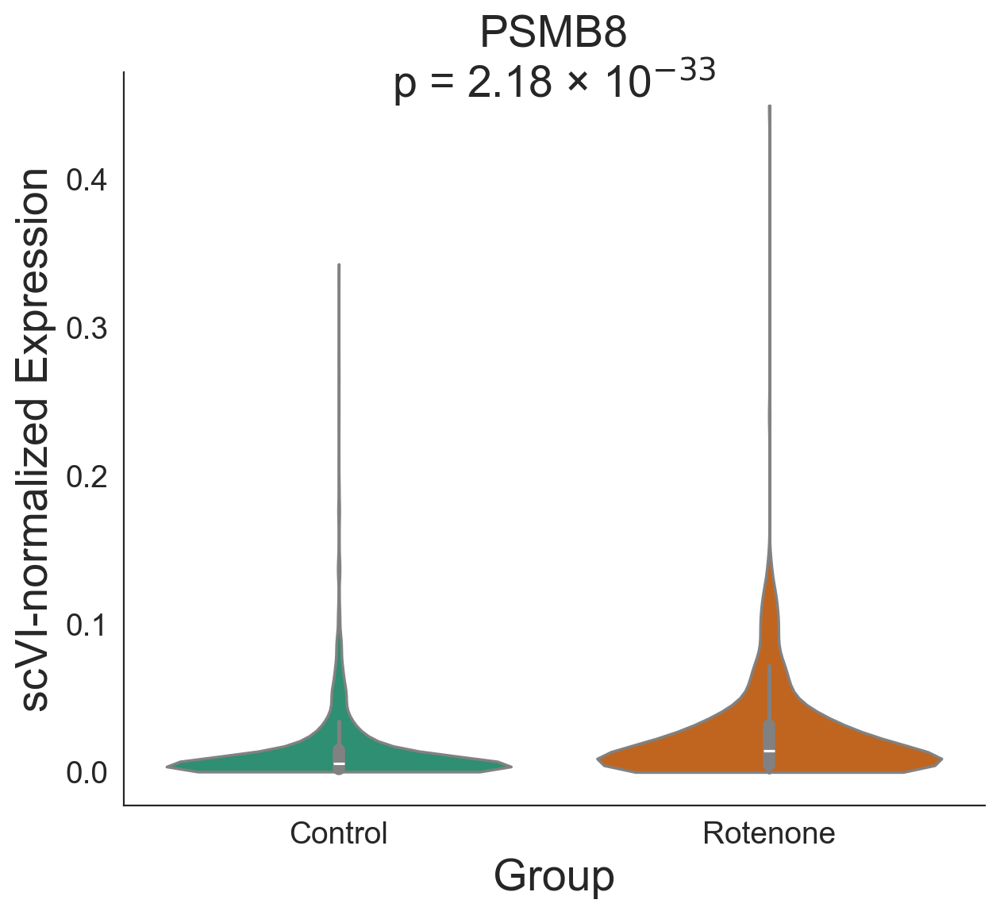

In [ ]:
sns.set_style("white")
temp.obs['Treatment'] = temp.obs['Treatment'].cat.reorder_categories(
    ['UNT', 'ROT'], ordered=True
)
temp.obs['Treatment'] = temp.obs['Treatment'].replace({'UNT': 'Control', 'ROT': 'Rotenone'})

fig, ax = plt.subplots(figsize=(7, 6))

sc.pl.violin(
    temp,
    keys='PSMB8',
    groupby='Treatment',
    layer='scvi_normalized',
    use_raw=False,
    log=False,
    xlabel='Group',
    ylabel='Expression',
    stripplot=False,
    inner='boxplot',
    palette='Dark2',
    fill=True,
    linecolor='#818181',
    alpha=0.99,
    size=3,
    ax=ax,
    show=False
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xlabel('Group', fontsize=20)
ax.set_ylabel('scVI-normalized Expression', fontsize=20)

ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

ax.text(
    0.5, 0.95,
    "PSMB8\np = 2.18 × 10$^{-33}$",
    fontsize=20,
    ha='center',
    va='bottom',
    transform=ax.transAxes,
    linespacing=1,
)

plt.savefig("results/PSMB8_violin_Rotenone-vs-untr.pdf", bbox_inches='tight')

# Show the plot
plt.show()

In [ ]:
temp =  adata[(adata.obs.cell_type.isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line.isin(['WT','HE']))]
i = np.where(temp.var_names == 'PSMB8')[0][0]

In [ ]:
a = temp[temp.obs.Cell_line == 'HE'].X[:,i]
b = temp[temp.obs.Cell_line == 'WT'].X[:,i]

c = stats.mannwhitneyu(a, b)
if c.pvalue < 10**-300:
    print("The p-value is less than 10^-300.")
else:
    print(f"The p-value is {result.pvalue}, which is not less than 10^-300.")

The p-value is less than 10^-300.


/var/folders/5w/4gxh3d6x6yj2hxct_tjf1rk80000gn/T/ipykernel_21710/452412310.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/var/folders/5w/4gxh3d6x6yj2hxct_tjf1rk80000gn/T/ipykernel_21710/452412310.py:6: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:900: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



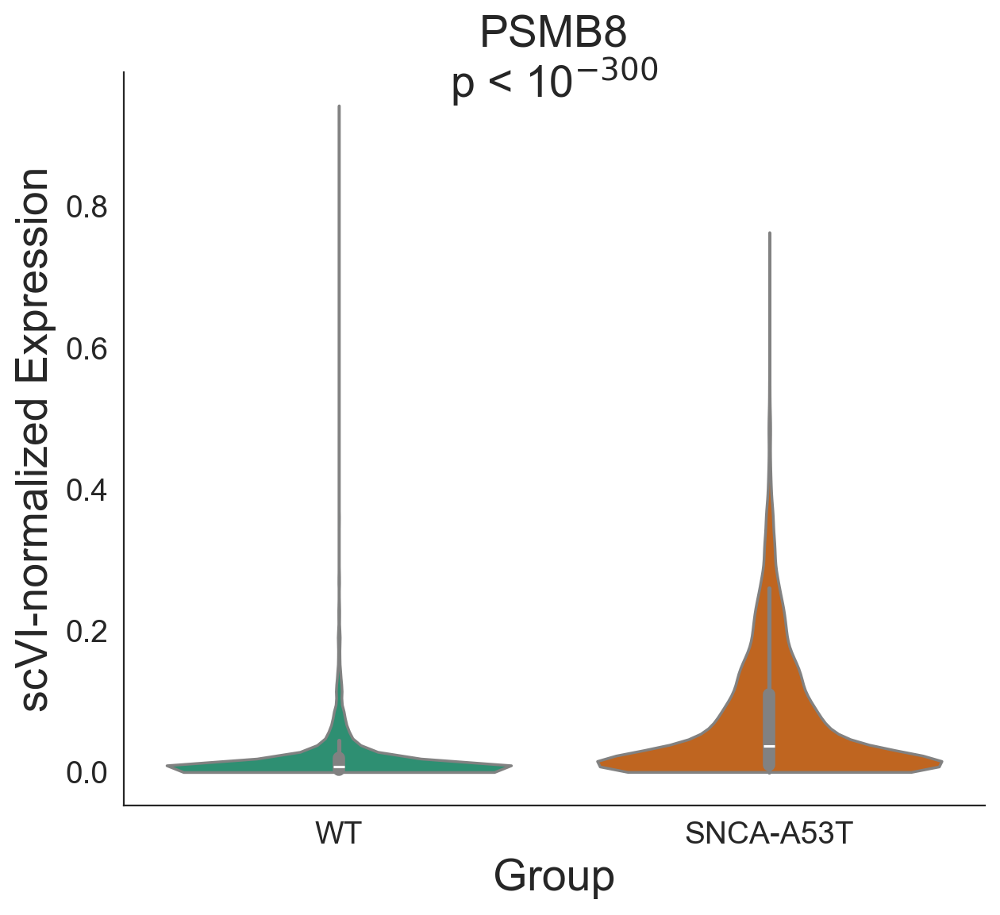

In [ ]:
sns.set_style("white")

temp.obs['Cell_line'] = temp.obs['Cell_line'].cat.reorder_categories(
    ['WT', 'HE'], ordered=True
)
temp.obs['Cell_line'] = temp.obs['Cell_line'].replace({'WT': 'WT', 'HE': 'SNCA-A53T'})

fig, ax = plt.subplots(figsize=(7, 6))

sc.pl.violin(
   temp,
    keys='PSMB8',
    groupby='Cell_line',
    layer='scvi_normalized',
    use_raw=False,
    log=False,
    xlabel='Group',
    ylabel='Expression',
    stripplot=False,
    inner='boxplot',
    palette='Dark2',
    fill=True,
    linecolor='#818181',
    alpha=0.99,
    size=3,
    ax=ax,
    show=False
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xlabel('Group', fontsize=20)
ax.set_ylabel('scVI-normalized Expression', fontsize=20)

ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

ax.text(
    0.5, 0.95,
    "PSMB8\np < 10$^{-300}$",
    fontsize=20,
    ha='center',
    va='bottom',
    transform=ax.transAxes,
    linespacing=1,
)


plt.savefig("results/PSMB8_violin_HEvsWT.pdf", bbox_inches='tight')

# Show the plot
plt.show()

## Human Gene Set: Reactome Pathway for Antigen Processing, Ubiquitination, and Proteasomal Degradation

*Getting "REACTOME_ANTIGEN_PROCESSING_UBIQUITINATION_PROTEASOME_DEGRADATION" gene set from GSEA
(https://www.gsea-msigdb.org/gsea/msigdb/human/geneset/REACTOME_ANTIGEN_PROCESSING_UBIQUITINATION_PROTEASOME_DEGRADATION.html)*

In [ ]:
appp_sig = pd.read_csv('data/REACTOME_ANTIGEN_PROCESSING_UBIQUITINATION_PROTEASOME_DEGRADATION.v2024.1.Hs.tsv', sep="\t").query("STANDARD_NAME == 'GENE_SYMBOLS'").iloc[0, 1].split(',')

In [ ]:
appp_sig

['KLHL13',
 'CDC27',
 'FBXL3',
 'ASB4',
 'MYLIP',
 'PSMB1',
 'UBE3C',
 'PSMC4',
 'RNF14',
 'UFL1',
 'UBR2',
 'UBA6',
 'RNF19A',
 'CUL3',
 'PSMA4',
 'CUL7',
 'NEDD4L',
 'ANAPC4',
 'CUL1',
 'UNKL',
 'RNF4',
 'BTBD1',
 'ASB1',
 'PSME4',
 'NEDD4',
 'RNF126',
 'LNX1',
 'UBE2D1',
 'FBXW11',
 'KLHL20',
 'UBE2A',
 'UBE2K',
 'ITCH',
 'UBE2D4',
 'KEAP1',
 'UBA5',
 'HACE1',
 'HUWE1',
 'PSMC5',
 'KLHL42',
 'ANAPC5',
 'PSME1',
 'HECTD1',
 'CDC23',
 'PSMD5',
 'PSMD8',
 'FBXL19',
 'CDC34',
 'KLHL22',
 'FBXO7',
 'RBX1',
 'TRIM9',
 'PSMC6',
 'PSMA3',
 'ASB2',
 'PSMC1',
 'PSMB5',
 'PSMA6',
 'PSME2',
 'PSMA7',
 'PSMD10',
 'ASB9',
 'MGRN1',
 'PSMD7',
 'FBXO31',
 'STUB1',
 'ELOB',
 'HERC1',
 'UBE2W',
 'FZR1',
 'PSMA2',
 'UBE2R2',
 'FBXW4',
 'FBXL15',
 'CUL2',
 'UBE2S',
 'FBXL20',
 'PSMD3',
 'TRIM37',
 'BLMH',
 'PSMD11',
 'SMURF2',
 'WSB1',
 'UBE2D3',
 'KLHL2',
 'FBXW7',
 'KLHL5',
 'ZBTB16',
 'UBE4A',
 'PSMD9',
 'SPSB2',
 'FBXO9',
 'FBXL4',
 'RNF130',
 'LNPEP',
 'SKP1',
 'UBE3A',
 'RNF7',
 'CBLB',
 'PSMD14'

# DE _ Volcano plot

*Differential expression was conducted using four mature neuron cluster (DA1, DA2, DA3, DA4)*

## DEG rotenone treated vs untreat in wild-type

In [ ]:
#Checking .X is scVI-normalized data!
adata.X.max()

3082.242

In [ ]:
scvi.settings.seed=1

Seed set to 1


In [ ]:
neu_dif_WT_ROT = model.differential_expression(
    idx1 = [(adata.obs['cell_type'].isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line == 'WT')  & (adata.obs.Treatment == 'ROT')],
    idx2 = [(adata.obs['cell_type'].isin(["DA1",'DA2','DA3','DA4']))  & (adata.obs.Cell_line == 'WT')  & (adata.obs.Treatment == 'UNT')])

DE...: 100%|██████████████████████████████████████| 1/1 [00:02<00:00,  2.28s/it]


In [ ]:
neu_dif_WT_ROT = model.differential_expression(
    idx1 = [(adata.obs['cell_type'].isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line == 'WT')  & (adata.obs.Treatment == 'ROT')],
    idx2 = [(adata.obs['cell_type'].isin(["DA1",'DA2','DA3','DA4']))  & (adata.obs.Cell_line == 'WT')  & (adata.obs.Treatment == 'UNT')])

DE...: 100%|██████████████████████████████████████| 1/1 [00:02<00:00,  2.11s/it]


In [ ]:
neu_dif_WT_ROT = model.differential_expression(
    idx1 = [(adata.obs['cell_type'].isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line == 'WT')  & (adata.obs.Treatment == 'ROT')],
    idx2 = [(adata.obs['cell_type'].isin(["DA1",'DA2','DA3','DA4']))  & (adata.obs.Cell_line == 'WT')  & (adata.obs.Treatment == 'UNT')])

DE...: 100%|██████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]


In [ ]:
neu_dif_WT_ROT["log10_pscore"] = np.log10(neu_dif_WT_ROT["proba_not_de"])

In [ ]:
neu_dif_WT_ROT['gene'] = neu_dif_WT_ROT.index
neu_dif_WT_ROT['label'] = neu_dif_WT_ROT.apply(
    lambda row: row['gene'] if row['is_de_fdr_0.05'] and row['gene'] in appp_sig else '', axis=1
)
neu_dif_WT_ROT.to_csv("results/scVI_DE_ROTVSNO_WT.csv", index=False)

/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


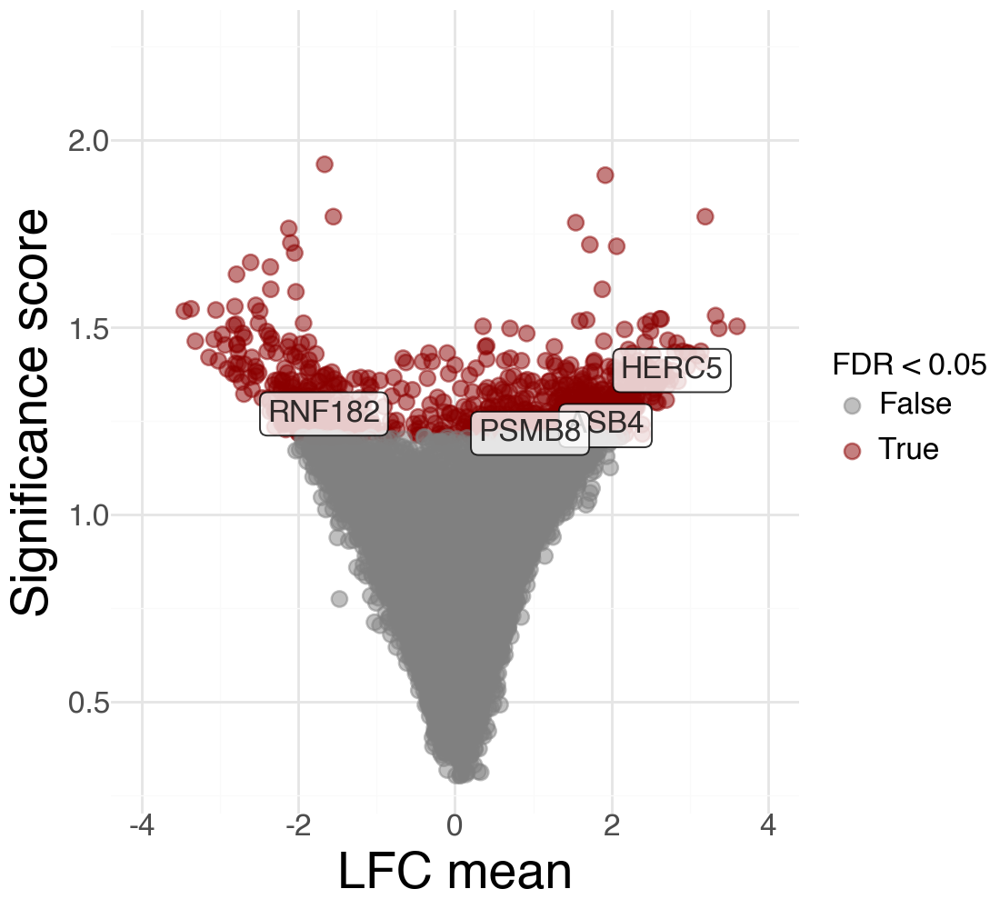

In [ ]:
plotneuWTdif = (
    ggplot(neu_dif_WT_ROT, aes(x="lfc_mean", y="-log10_pscore", color="is_de_fdr_0.05"))
    + geom_point(alpha=0.5, size=3)
    + scale_color_manual(
        values={True: "darkred", False: "gray"}
    )
    + p9.ylim(0.3, 2.25
             )
    + p9.xlim(-4, 4)
    + labs(
        x="LFC mean",
        y="Significance score",
        color="FDR < 0.05"
    )
    + geom_label(
        data=neu_dif_WT_ROT[neu_dif_WT_ROT['label'] != ''],
        mapping=aes(label='label'),
        size=12, color="black", fill="white", alpha=0.8
    )
    +p9.theme_minimal()
    + theme(
        axis_title_x=element_text(size=20),
        axis_title_y=element_text(size=20),
        axis_text_x=element_text(size=12),
        axis_text_y=element_text(size=12),
        legend_title=element_text(size=12),
        legend_text=element_text(size=12),
        figure_size=(5.5, 5)
    )

)
plotneuWTdif


In [ ]:
rcParams['font.family'] = ['Helvetica']
plotneuWTdif.save(
    filename="results/Vol_scVI_ROTvsUNTR.png",
    dpi=2000,
    width=5.5,
    height=5,
    units="in"
)

/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 5.5 x 5 in image.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: results/Vol_scVI_ROTvsUNTR.png
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


## DEG A53T treated vs wild-type

In [ ]:
a = model.differential_expression(
    idx1 = [(adata.obs['cell_type'].isin(['DA1','DA2','DA3','DA4'])) & (adata.obs.Cell_line == 'HE')],
    idx2 = [(adata.obs['cell_type'].isin(["DA1",'DA2','DA3','DA4']))  & (adata.obs.Cell_line == 'WT')])

DE...: 100%|██████████████████████████████████████| 1/1 [00:03<00:00,  3.35s/it]


In [ ]:
a["log10_pscore"] = np.log10(a["proba_not_de"])
a['gene'] = a.index
a['label'] = a.apply(
    lambda row: row['gene'] if row['is_de_fdr_0.05'] and row['gene'] in appp_sig else '', axis=1
)
print("Changes",a[(a['is_de_fdr_0.05']== True)].shape)
print("Upregulation",a[(a['is_de_fdr_0.05']== True) & (a['lfc_mean']>0)].shape)
print("Downregulation",a[(a['is_de_fdr_0.05']== True) & (a['lfc_mean']<0)].shape)
a.to_csv("results/scVI_DE_HEvsWT_Jan1.csv", index= True)

Changes (413, 22)
Upregulation (305, 22)
Downregulation (108, 22)


/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 2 rows containing missing values.


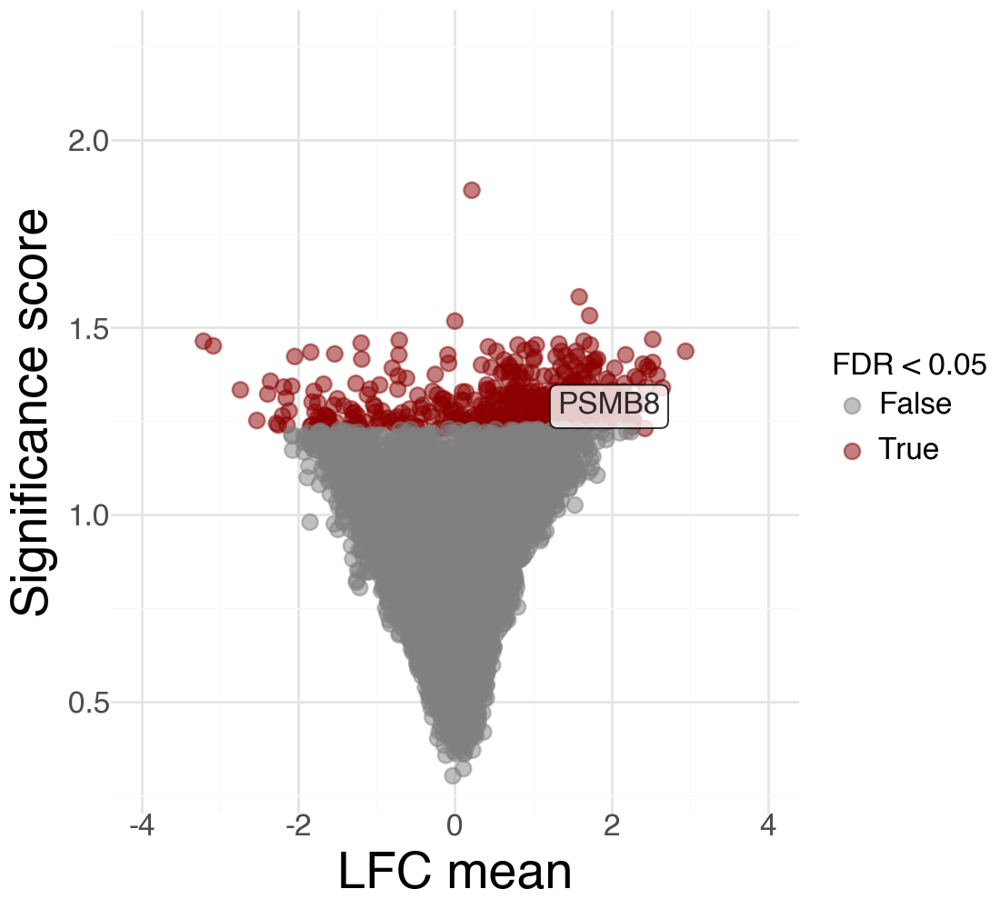

In [ ]:
# HE vs WT (all treat-no)
plotneuhevswt = (
    ggplot(a, aes(x="lfc_mean", y="-log10_pscore", color="is_de_fdr_0.05"))
    + geom_point(alpha=0.5, size=3)
    + scale_color_manual(
        values={True: "darkred", False: "gray"}
    )
    + p9.ylim(0.3, 2.25
             )
    + p9.xlim(-4, 4)
    + labs(
        x="LFC mean",
        y="Significance score",
        color="FDR < 0.05"
    )
    + geom_label(
        data=a[a['label']== 'PSMB8'],
        mapping=aes(label='label'),
        size=12, color="black", fill="white", alpha=0.8
    )
    +p9.theme_minimal()

    + theme(
        axis_title_x=element_text(size=20),
        axis_title_y=element_text(size=20),
        axis_text_x=element_text(size=12),
        axis_text_y=element_text(size=12),
        legend_title=element_text(size=12),
        legend_text=element_text(size=12),
        figure_size=(5.5, 5)
    )

)

plotneuhevswt

In [ ]:
plotneuhevswt.save(
    filename="results/Vol_scVI_HEvsWT.png",
    dpi=2000,
    width=5.5,
    height=5,
    units="in"
)

/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 5.5 x 5 in image.
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: results/Vol_scVI_HEvsWT.png
/Users/nguyenhuudat/miniforge3/envs/arm_env/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 2 rows containing missing values.
